# Dataset

## Preprocessing

In [1]:
import pandas as pd
import numpy as np
import keras
import tensorflow as tf

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler

In [2]:
df = pd.read_csv('../dataset/open-meteo_radiation.csv')
df.head()

,time,shortwave_radiation_instant (W/m²),direct_radiation_instant (W/m²),diffuse_radiation_instant (W/m²),direct_normal_irradiance_instant (W/m²),terrestrial_radiation_instant (W/m²)
0,2019-01-01T00:00,48.2,0.0,48.2,0.0,368.1
1,2019-01-01T01:00,128.6,16.1,112.5,46.1,609.9
2,2019-01-01T02:00,104.4,4.5,99.9,9.0,794.1
3,2019-01-01T03:00,187.5,7.4,180.1,12.2,908.4
4,2019-01-01T04:00,194.4,13.2,181.2,19.9,944.8


In [3]:
df.set_index('time', inplace=True)

df.head()

,shortwave_radiation_instant (W/m²),direct_radiation_instant (W/m²),diffuse_radiation_instant (W/m²),direct_normal_irradiance_instant (W/m²),terrestrial_radiation_instant (W/m²)
time,,,,,
2019-01-01T00:00,48.2,0.0,48.2,0.0,368.1
2019-01-01T01:00,128.6,16.1,112.5,46.1,609.9
2019-01-01T02:00,104.4,4.5,99.9,9.0,794.1
2019-01-01T03:00,187.5,7.4,180.1,12.2,908.4
2019-01-01T04:00,194.4,13.2,181.2,19.9,944.8


In [4]:
print(df.shape)

(8760, 5)


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8760 entries, 2019-01-01T00:00 to 2019-12-31T23:00
Data columns (total 5 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   shortwave_radiation_instant (W/m²)       8760 non-null   float64
 1   direct_radiation_instant (W/m²)          8760 non-null   float64
 2   diffuse_radiation_instant (W/m²)         8760 non-null   float64
 3   direct_normal_irradiance_instant (W/m²)  8760 non-null   float64
 4   terrestrial_radiation_instant (W/m²)     8760 non-null   float64
dtypes: float64(5)
memory usage: 410.6+ KB


In [6]:
data_features = df[['shortwave_radiation_instant (W/m²)', 'direct_radiation_instant (W/m²)', 'diffuse_radiation_instant (W/m²)',
                    'direct_normal_irradiance_instant (W/m²)', 'terrestrial_radiation_instant (W/m²)']].values
data_target = df['diffuse_radiation_instant (W/m²)'].values

In [7]:
print(len(data_features))

8760


In [8]:
look_back = 24 #menggunakan timestamp 24
n_ahead = 24 # predict 24 jam berikutnya

x_seq = []
y_seq = []

for i in range(len(data_features) - look_back - n_ahead + 1):
    print("i: ", i)
    print("untuk x seq: ", i + look_back)
    print("i + lookback: ", i + look_back)
    print("i + look_back + n_ahead: ", i + look_back + n_ahead)
    x_seq.append(data_features[i : (i + look_back)]) # mengambil value 24 jam sebelum
    y_seq.append(data_target[(i + look_back) : (i + look_back + n_ahead)]) #mengambil value 24 jam berikutnya

x_seq, y_seq = np.array(x_seq), np.array(y_seq)

i:  0
untuk x seq:  24
i + lookback:  24
i + look_back + n_ahead:  48
i:  1
untuk x seq:  25
i + lookback:  25
i + look_back + n_ahead:  49
i:  2
untuk x seq:  26
i + lookback:  26
i + look_back + n_ahead:  50
i:  3
untuk x seq:  27
i + lookback:  27
i + look_back + n_ahead:  51
i:  4
untuk x seq:  28
i + lookback:  28
i + look_back + n_ahead:  52
i:  5
untuk x seq:  29
i + lookback:  29
i + look_back + n_ahead:  53
i:  6
untuk x seq:  30
i + lookback:  30
i + look_back + n_ahead:  54
i:  7
untuk x seq:  31
i + lookback:  31
i + look_back + n_ahead:  55
i:  8
untuk x seq:  32
i + lookback:  32
i + look_back + n_ahead:  56
i:  9
untuk x seq:  33
i + lookback:  33
i + look_back + n_ahead:  57
i:  10
untuk x seq:  34
i + lookback:  34
i + look_back + n_ahead:  58
i:  11
untuk x seq:  35
i + lookback:  35
i + look_back + n_ahead:  59
i:  12
untuk x seq:  36
i + lookback:  36
i + look_back + n_ahead:  60
i:  13
untuk x seq:  37
i + lookback:  37
i + look_back + n_ahead:  61
i:  14
untuk x s

In [9]:
print(x_seq.shape)
print(y_seq.shape)

(8713, 24, 5)
(8713, 24)


In [10]:
split_point = int(len(x_seq) * 0.8) # 80% for training and 20% for testing

x_train, x_test = x_seq[:split_point], x_seq[split_point:]
y_train, y_test = y_seq[:split_point], y_seq[split_point:]

#flatten the y

y_train = y_train.flatten()
y_test = y_test.flatten()

print(f'x_train shape: {x_train.shape}, x_test shape: {x_test.shape}')
print(f'y_train shape: {y_train.shape}, y_test shape: {y_test.shape}')

x_train shape: (6970, 24, 5), x_test shape: (1743, 24, 5)
y_train shape: (167280,), y_test shape: (41832,)


In [11]:
from sklearn.preprocessing import StandardScaler, RobustScaler

scaler_x = RobustScaler()
scaler_y = RobustScaler()

#fit dan transform the training data
#kalau mau fit transform, data harus 2 dimensi. untuk x, kembalikan ke 3 dimensi. untuk y, kembalikan 1 dimensi
x_train_scaled = scaler_x.fit_transform(x_train.reshape(-1, x_train.shape[2])).reshape(x_train.shape[0], x_train.shape[1], x_train.shape[2]) 
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, n_ahead))
# y_train_scaled = y_train_scaled.flatten()

# tranform the testing data
x_test_scaled = scaler_x.fit_transform(x_test.reshape(-1, x_train.shape[2])).reshape(x_test.shape[0], x_test.shape[1], x_train.shape[2])
y_test_scaled = scaler_y.transform(y_test.reshape(-1, n_ahead))
# y_test_scaled = y_test_scaled.flatten()

# # Reshape X_train and X_test to 3D for LSTM input (samples, time steps, features)
# X_train_scaled = X_train.reshape(X_train_scaled.shape[0], X_train_scaled.shape[1], 1)
# X_test_scaled = X_test_scaled.reshape(X_test_scaled.shape[0], X_test_scaled.shape[1], 1)

# Check the shapes after standardization
print(f'X_train_scaled shape: {x_train_scaled.shape}, X_test_scaled shape: {x_test_scaled.shape}')
print(f'y_train_scaled shape: {y_train_scaled.shape}, y_test_scaled shape: {y_test_scaled.shape}')

X_train_scaled shape: (6970, 24, 5), X_test_scaled shape: (1743, 24, 5)
y_train_scaled shape: (6970, 24), y_test_scaled shape: (1743, 24)


# Build Model

## Transformer encoder

In [12]:
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    # Attention and Normalization
    x = keras.layers.MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(inputs, inputs)
    x = keras.layers.Dropout(dropout)(x)
    x = keras.layers.LayerNormalization(epsilon=1e-6)(x)
    res = x + inputs

    # Feed Forward Part
    x = keras.layers.Conv1D(filters=ff_dim, kernel_size=1, activation="relu")(res)
    x = keras.layers.Dropout(dropout)(x)
    x = keras.layers.Conv1D(filters=inputs.shape[-1], kernel_size=1)(x)
    x = keras.layers.LayerNormalization(epsilon=1e-6)(x)
    return x + res

In [13]:
class ExpandDims(keras.layers.Layer):
    def __init__(self, axis, **kwargs):
        super(ExpandDims, self).__init__(**kwargs)
        self.axis = axis

    def call(self, inputs):
        return tf.expand_dims(inputs, axis=self.axis)

## Combine transformer encoder with LSTM

In [14]:
def build_model(
    n_input,
    n_output,
    num_features,
    head_size,
    num_heads,
    ff_dim,
    num_transformer_blocks,
    mlp_units,
    dropout=0,
    mlp_dropout=0,
):
    inputs = keras.Input(shape=(n_input, num_features))
    x = inputs
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    # x = keras.layers.GlobalAveragePooling1D(data_format="channels_last")(x)
    # x = ExpandDims(axis=1)(x)
    print(x.shape)
    
    # taruh LSTM disini
    x = keras.layers.LSTM(units=32, name="lstm_encoder_hidden", return_sequences=True, 
                        kernel_initializer='he_normal',
                        kernel_regularizer=keras.regularizers.l2(0.01))(x)
    x = keras.layers.Dropout(0.25)(x)
    x, state_h, state_c = keras.layers.LSTM(units=32, return_state=True, return_sequences=True, 
                                          name="lstm_encoder")(x)

    x = keras.layers.LSTM(units=32, return_sequences=True, name="lstm_decoder")(x, initial_state=[state_h, state_c])    
    x = keras.layers.LayerNormalization(epsilon=1e-6)(x)
    x = keras.layers.Dropout(0.2)(x)
    x = keras.layers.LSTM(units=32, name="lstm_decoder_final", return_sequences=False)(x)

    for dim in mlp_units:
        x = keras.layers.Dense(dim, activation="relu")(x)
        x = keras.layers.Dropout(mlp_dropout)(x)

    outputs = keras.layers.Dense(n_output, activation="softmax")(x)
    return keras.Model(inputs, outputs)


# Train and evaluate

In [15]:
model = build_model(
    n_input=look_back,
    n_output=n_ahead,
    num_features=x_train_scaled.shape[2],
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128],
    mlp_dropout=0.4,
    dropout=0.25,
)

model.compile(
    loss="categorical_crossentropy",
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    metrics=["accuracy"],
)
model.summary()

callbacks = [keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True) ]

model.fit(
    x_train_scaled,
    y_train_scaled,
    validation_split=0.2,
    epochs=5,
    batch_size=50,
    callbacks=callbacks,
)

model.evaluate(x_test_scaled, y_test_scaled, verbose=1)

(None, 24, 5)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 24, 5)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 24, 5)     │     23,557 │ input_layer[0][0… │
│ (MultiHeadAttentio… │                   │            │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 24, 5)     │          0 │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 24, 5)     │         10 │ dropout_1[0][0]   │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 24, 5)     │          0 │ layer_normalizat… │
│                     │                   │            │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d (Conv1D)     │ (None, 24, 4)     │         24 │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 24, 4)     │          0 │ conv1d[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1 (Conv1D)   │ (None, 24, 5)     │         25 │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 24, 5)     │         10 │ conv1d_1[0][0]    │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 24, 5)     │          0 │ layer_normalizat… │
│                     │                   │            │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 24, 5)     │     23,557 │ add_1[0][0],      │
│ (MultiHeadAttentio… │                   │            │ add_1[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 24, 5)     │          0 │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 24, 5)     │         10 │ dropout_4[0][0]   │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, 24, 5)     │          0 │ layer_normalizat… │
│                     │                   │            │ add_1[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2 (Conv1D)   │ (None, 24, 4)     │         24 │ add_2[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 24, 4)     │          0 │ conv1d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_3 (Conv1D)   │ (None, 24, 5)     │         25 │ dropout_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 24, 5)     │         10 │ conv1d_3[0][0]    │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_3 (Add)         │ (None, 24, 5)     │          0 │ layer_normalizat… │
│                     │                   │            │ add_2[0][0]       │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 131,712 (514.50 KB)

 Trainable params: 131,712 (514.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/5
112/112 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.0391 - loss: 40.9343 - val_accuracy: 0.0416 - val_loss: 37.5090
Epoch 2/5
112/112 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - accuracy: 0.0390 - loss: 43.4923 - val_accuracy: 0.0416 - val_loss: 40.9910
Epoch 3/5
112/112 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - accuracy: 0.0444 - loss: 50.6237 - val_accuracy: 0.0416 - val_loss: 45.6053
Epoch 4/5
112/112 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.0455 - loss: 59.8105 - val_accuracy: 0.0416 - val_loss: 50.4649
Epoch 5/5
112/112 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - accuracy: 0.0392 - loss: 70.8824 - val_accuracy: 0.0416 - val_loss: 55.1070
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.0427 - loss: 32.8642


[29.678163528442383, 0.04188181459903717]

# Predict

In [16]:
# Make predictions on the test set
y_pred_scaled = model.predict(x_test_scaled)

# De-standardize the predictions using the same scaler as for y
y_pred = scaler_y.inverse_transform(y_pred_scaled).flatten()

# De-standardize the actual values
y_test = scaler_y.inverse_transform(y_test_scaled).flatten()

55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step


In [17]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae}')
print(f'Mean Squared Error (MSE): {mse}')

Mean Absolute Error (MAE): 55.761248438894974
Mean Squared Error (MSE): 8002.855138407332


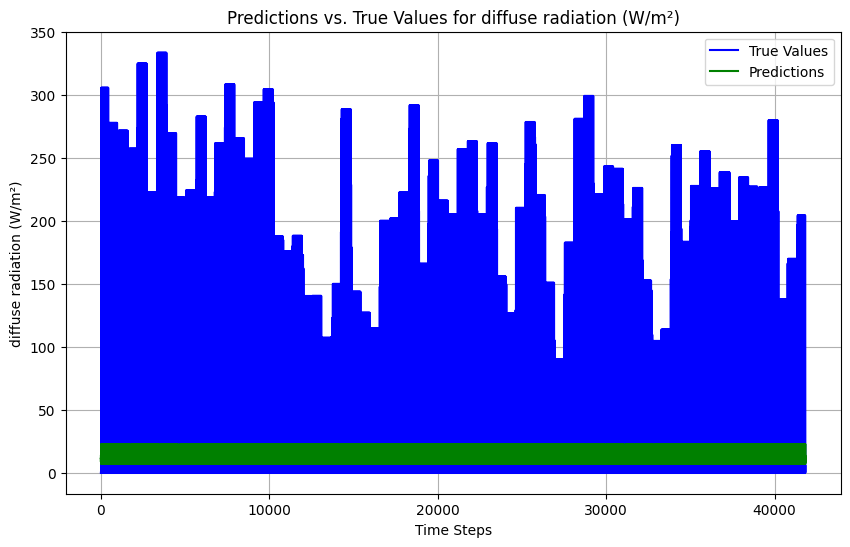

In [18]:
# prompt: plot the prediction vs true test

# Plot the predictions vs. true values
plt.figure(figsize=(10, 6))
plt.plot(y_test, label='True Values', color='blue')
plt.plot(y_pred, label='Predictions', color='green')
plt.title('Predictions vs. True Values for diffuse radiation (W/m²)')
plt.xlabel('Time Steps')
plt.ylabel('diffuse radiation (W/m²)')
plt.legend()
plt.grid(True)
plt.show()

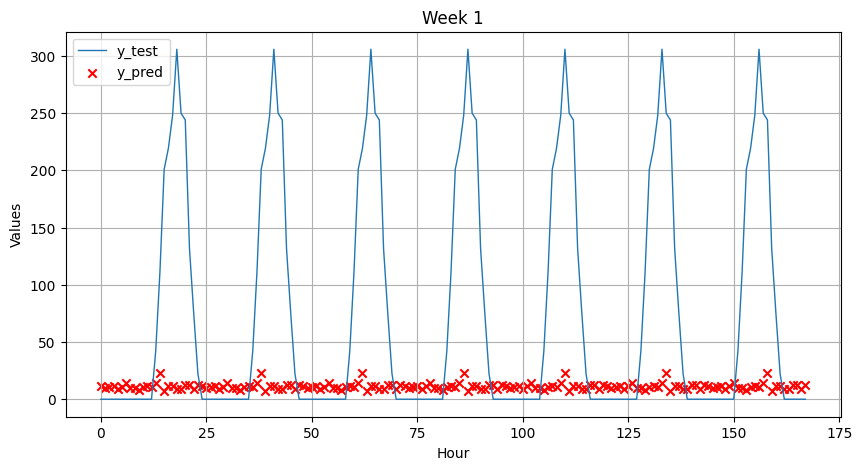

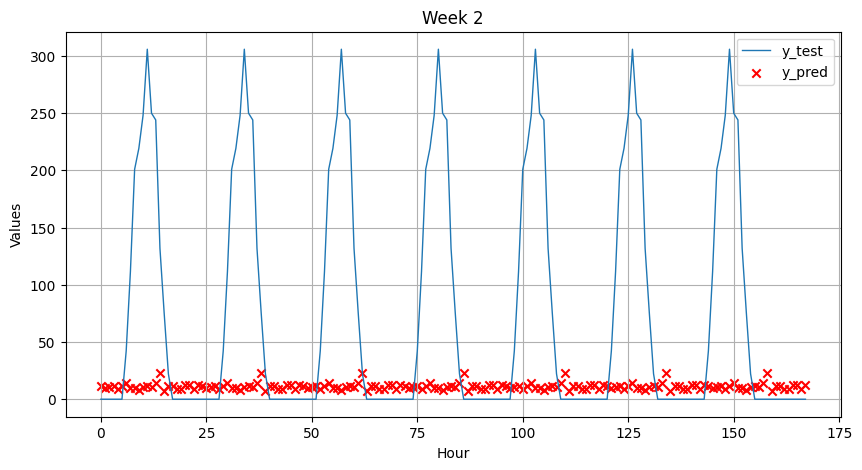

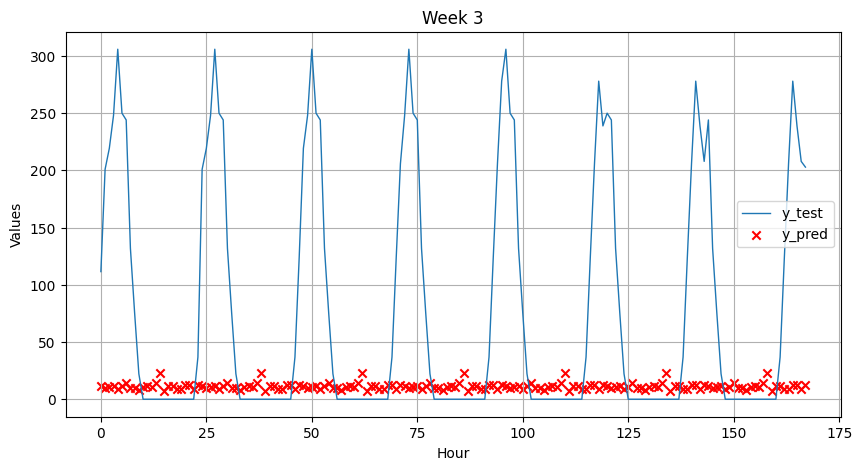

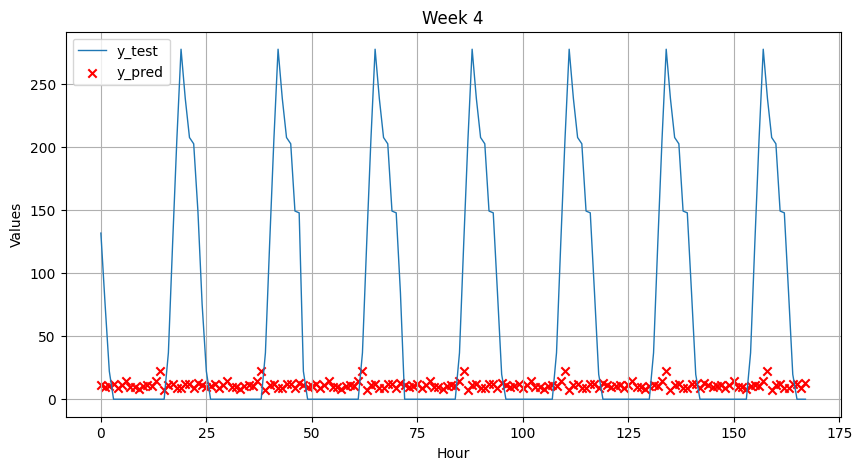

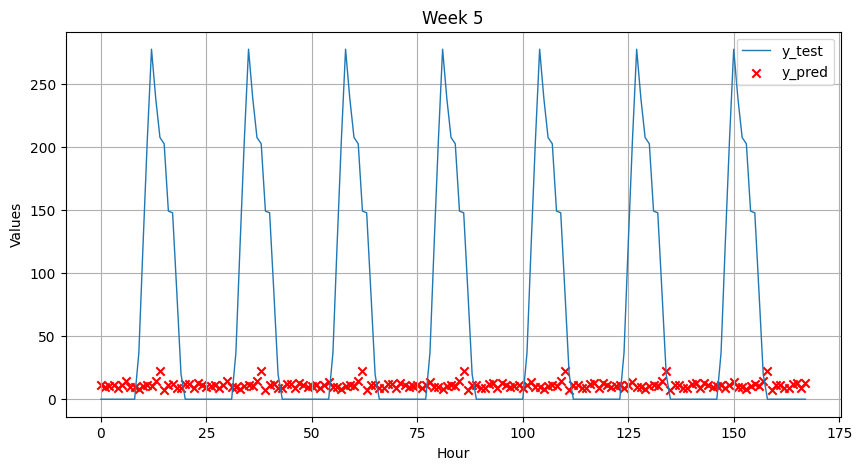

...

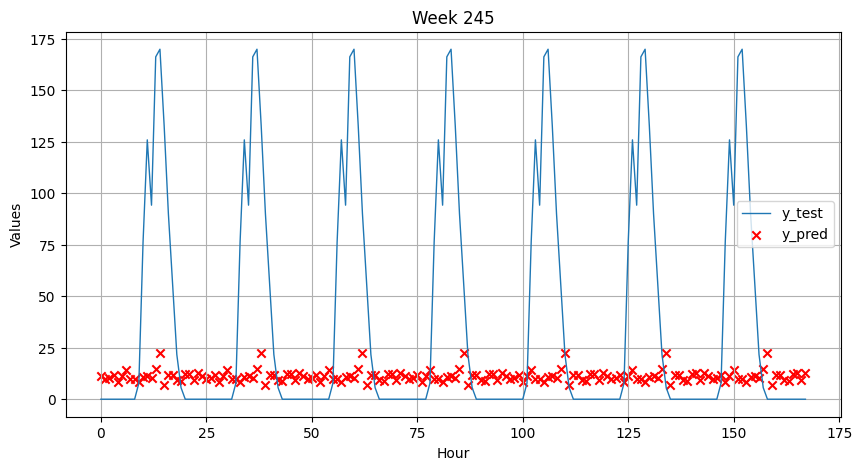

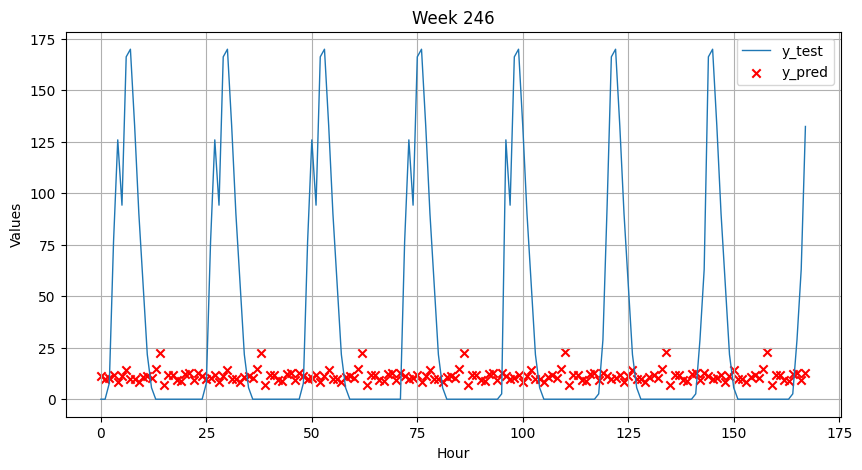

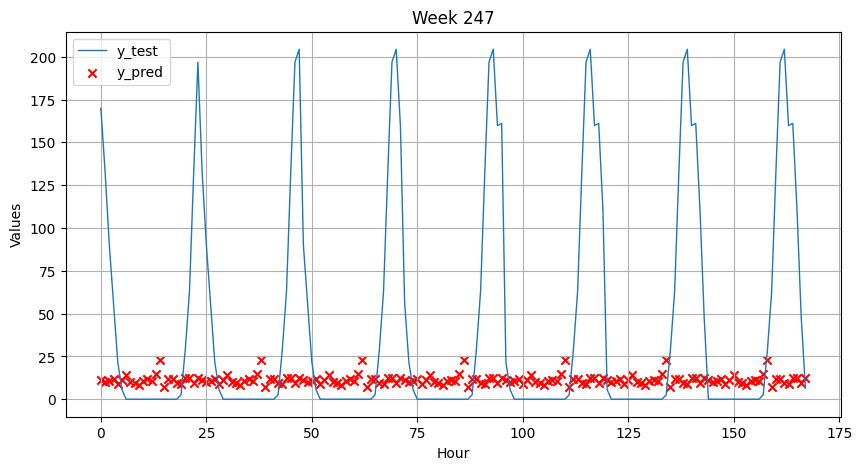

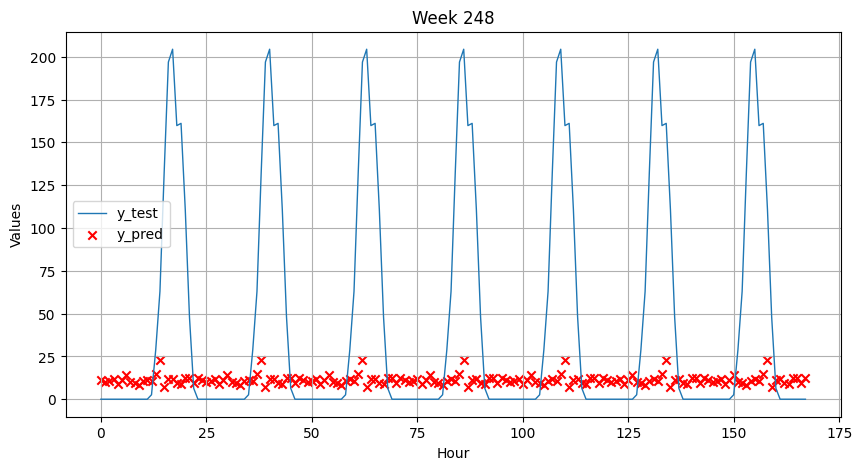

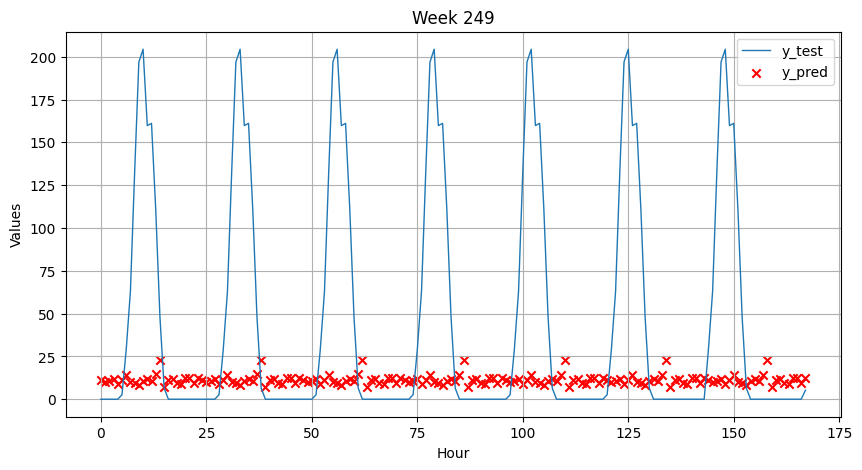

In [19]:
hours_per_week = 24 * 7

num_weeks = len(y_pred) // hours_per_week

for week in range(num_weeks):
    start_idx = week * hours_per_week
    end_idx = start_idx + hours_per_week
    plt.figure(figsize=(10, 5))  # Set ukuran figure
    plt.plot(y_test[start_idx:end_idx], label='y_test', linewidth=1)
    plt.scatter(range(hours_per_week), y_pred[start_idx:end_idx], color='red', marker='x', label='y_pred')
    plt.title(f'Week {week + 1}')
    plt.xlabel('Hour')
    plt.ylabel('Values')
    plt.legend()
    plt.grid(True)
    plt.show()